<a href="https://colab.research.google.com/github/JhonathanOrtiz/OpenCV-python/blob/master/intro_to_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



> Intro to OpenCV library to computer vision



In [3]:
from google.colab import files
files.upload()


Saving 8b048-gustavo2bdudamel2by2bsinfonica2bde2bla2bjuventud2bvenezolana-763988.jpg to 8b048-gustavo2bdudamel2by2bsinfonica2bde2bla2bjuventud2bvenezolana-763988.jpg


{'8b048-gustavo2bdudamel2by2bsinfonica2bde2bla2bjuventud2bvenezolana-763988.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xe1(\x9cExif\x00\x00II*\x00\x08\x00\x00\x00\x0c\x00\x0f\x01\x02\x00\x06\x00\x00\x00\x9e\x00\x00\x00\x10\x01\x02\x00\x0e\x00\x00\x00\xa4\x00\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00\xb2\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\xba\x00\x00\x001\x01\x02\x00\x0b\x00\x00\x00\xc2\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00\xce\x00\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00\x01\x10\x03\x00\x01\x00\x00\x00\x00\x06\x00\x00\x02\x10\x03\x00\x01\x00\x00\x00\x00\x04\x00\x00i\x87\x04\x00\x01\x00\x00\x00\xe2\x00\x00\x00R\x05\x00\x00Canon\x00Canon EOS 10D\x00\xb4\x00\x00\x00\x01\x00\x00\x00\xb4\x00\x00\x00\x01\x00\x00\x00Picasa 3.0\x00\x002005:09:27 22:57:00\x00\x12\x00\'\x88\x03\x00\x01\x00\x00\x00\x90\x01\x00\x00\x00\x90\x07\x00\x04\x00\x00\x000220

Width 1024 height 1536 channel 3. 


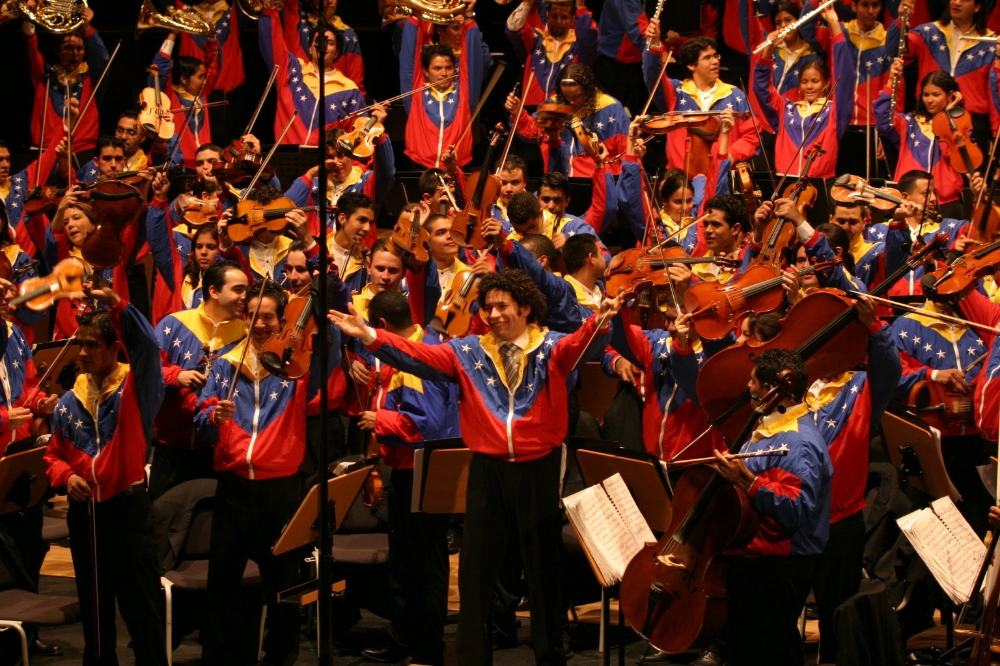

-1

In [9]:
import cv2 
import imutils
from google.colab.patches import cv2_imshow

#imread function help us to read images.
image = cv2.imread('/content/8b048-gustavo2bdudamel2by2bsinfonica2bde2bla2bjuventud2bvenezolana-763988.jpg')

#Images are readed like numpy array, x, y, z are the width, height and channel
w, h, c = image.shape

print('Width {} height {} channel {}. '.format(w, h, c))

#To show an image we can use show() function with ('Name', image) argument where 'Name' is a string and image is the image to show
cv2_imshow(image)
cv2.waitKey(0)




> What's a Pixel?

Pixel is each cell that build an image, We could compare with a matrix where a Pixel is each number in a matrix. Each pixel take values between 0 and 255 that represent color intesity. In a color image we have 3 Matrix where each matrix represents a color (R, G, B), then the values en each color matrix represents the intensity of a color.

Each value in the BGR 3-tuple has a range of [0, 255] . How many color possibilities are there for each pixel in an RGB image in OpenCV? That’s easy: 256 * 256 * 256 = 16777216



In [16]:
#We can access to each pixel value in a image, OpenCV ream image in BGR format not in RGB

(B, G, R) = image[100, 100] #We'll access to pixel value in (x=100, y=100)
print('BGR FORMAT: ')
print('Blue intensity value {} Green Intensity Value {}, Red intensity {}'.format(B, G, R))
print('')

#We can change BGR format to RGB format
RGB_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
(R, G, B) = RGB_image[100,100]
print('RGB FORMAT')
print('Red intensity {} Green intensity {} Blue intensity {}'.format(R, G, B))


BGR FORMAT: 
Blue intensity value 3 Green Intensity Value 9, Red intensity 38

RGB FORMAT
Red intensity 38 Green intensity 9 Blue intensity 3




> Slicing and cropping

We can extact region of interest with like a matrix with a index, example


```
region_of_interest = image[y_start:y_end, x_start:x_end]
```





(200, 200, 3)


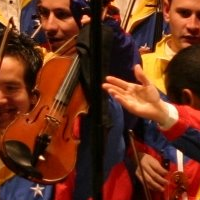

In [18]:
#Our image has Width 1024 height 1536 channel 3.  where width is (X) and Heiht is (y)

ROI = image [400:600, 400:600]
print(ROI.shape)
cv2_imshow(ROI)

#That's a random crop but there are algorithm and and functions that return x-yCordinates and height and width of a region of interest



>Resize image



Resized with area interpolation


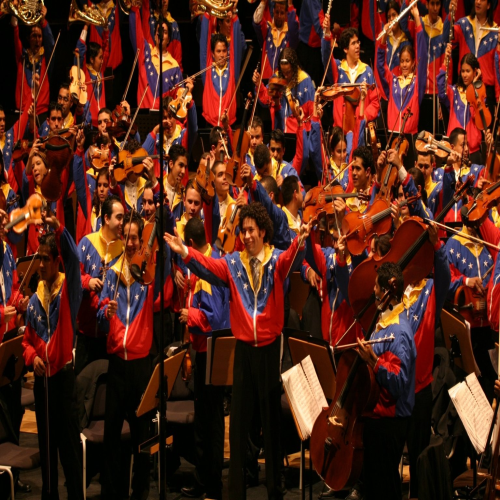


Resized with nearest interpolation


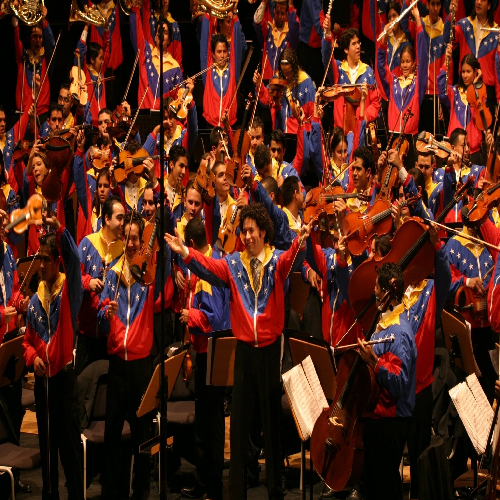


Resized with linear interpolation


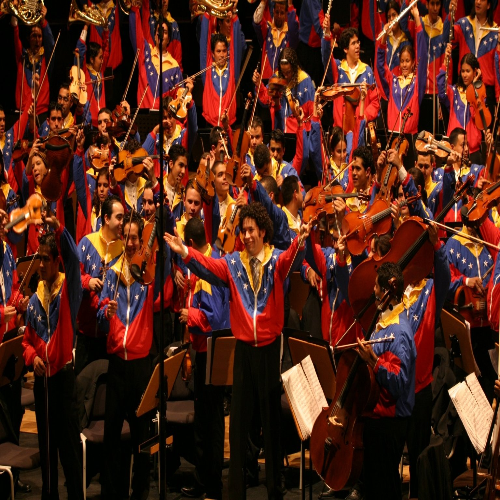

In [20]:
resized_1 = cv2.resize(image, (500,500), interpolation=cv2.INTER_AREA)
resized_2 = cv2.resize(image, (500,500), interpolation=cv2.INTER_NEAREST)
resized_3 = cv2.resize(image, (500,500), interpolation=cv2.INTER_LINEAR)

print('Resized with area interpolation')
cv2_imshow(resized_1)
print('')
print('Resized with nearest interpolation')
cv2_imshow(resized_2)
print('')
print('Resized with linear interpolation')
cv2_imshow(resized_3)

Resize with heiht ratio


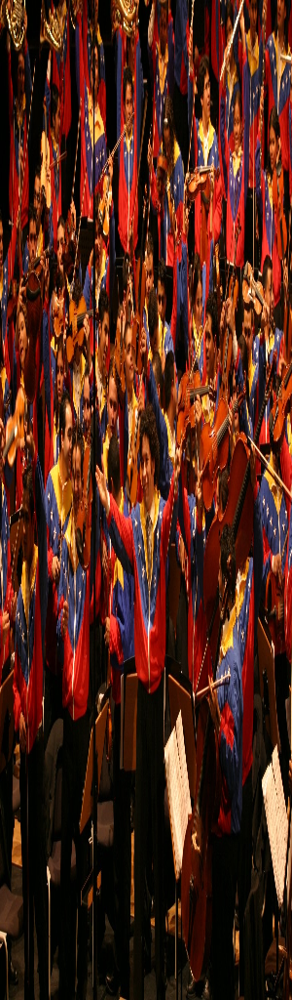


Resize with width ratio


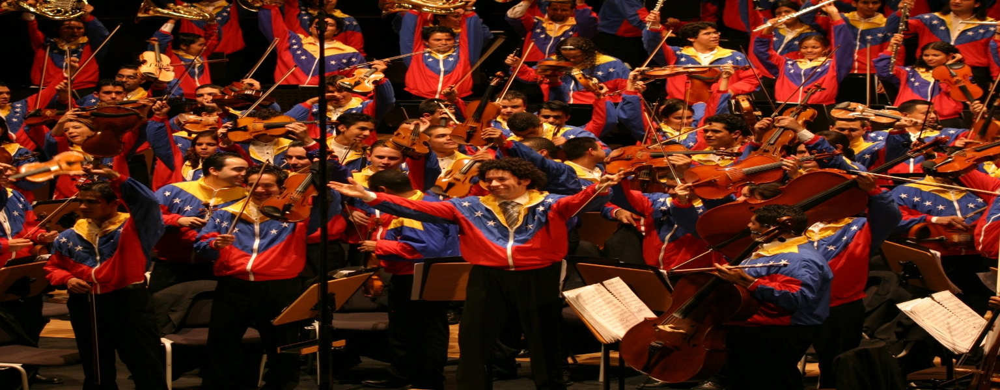

In [30]:
#We can reize with ratio
def resize(image,ratio, r_height=True):
  
  w, h, c = image.shape
  if r_height:
    r = ratio / h
    resized = cv2.resize(image, (int(h * r), w))

    return resized
  else:
    r = ratio / w
    resized = cv2.resize(image, (h, int(w*r)))

    return resized
  
resized_4 = resize(image, 300)
print('Resize with heiht ratio')
cv2_imshow(resized_4)
print('')

resized_5 = resize(image, 600, r_height=False)
print('Resize with width ratio')
cv2_imshow(resized_5)
print('')



> OpenCV Smoothing



blurred image


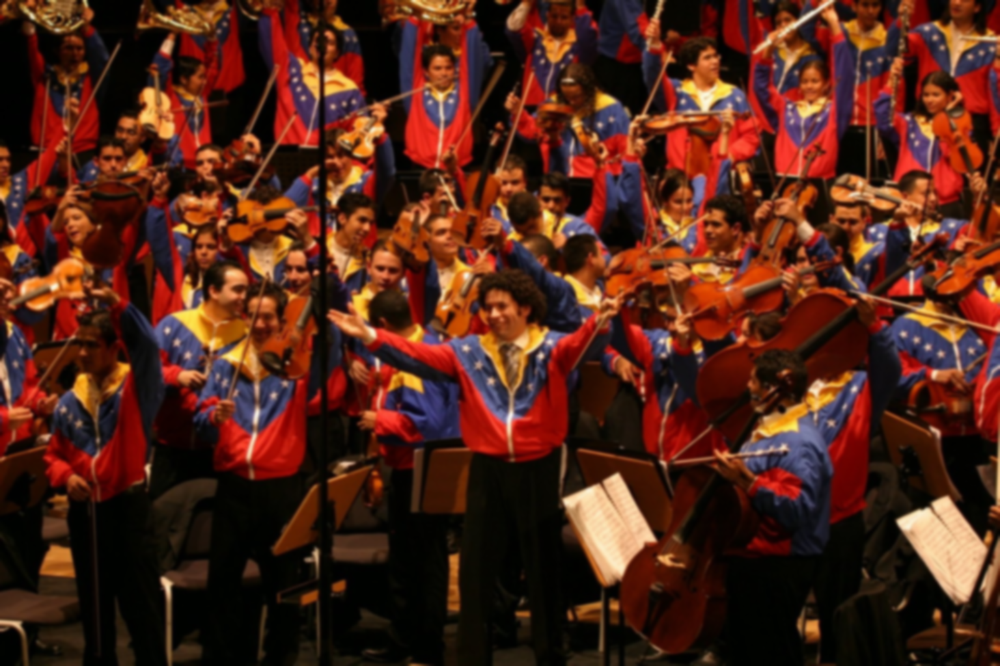

In [35]:
#Ksize is a kernel size like CNN a little matrix to slice over image
blurred= cv2.GaussianBlur(image, ksize=(11,11), sigmaX=0)
print('blurred image')
cv2_imshow(blurred) 




> Drawing on images

We can draw forms or text on an image with OpenCV

```
cv2.rectangle(img, ponit_1, point_2, color, thickness)
```
**Img:** Image where we going to draw

**poin_1:**  Our starting pixel coordinate which is the top-left.

**poin_2:**  Our ending pixel coordinate which is the bottom-left.

**Color:**   Rectangle color given in a 3-tuple (B, G, R).

**Thickness:** Line thickness (a negative value will make a solid rectangle).

```
cv2.circle(img, center, radius, color, thickness)
```

**img:** Image where we going  draw.

**Center**: Coordinates(x,y) circle center

**Radius:*** The circle radius in pixels.

**Color:**   Rectangle color given in a 3-tuple (B, G, R).

**Thickness:** The line thickness if -1 is provided circle will be filled/solid

```
cv2.circle(img, start_point, end_point, color, thickness)
```

**img:** Image where we going  draw.

**Start_point**: Coordinates(x,y) where the line start

**end_point:***  Coordinates(x,y) where the line ends

**Color:**   Rectangle color given in a 3-tuple (B, G, R).

**Thickness:**  Line thickness (a negative value will make a solid rectangle).

```
cv2.putText(img, text, pt, font, scale, color, thickness)
```
**img**  The output image.

**text :** The string of text we’d like to write/draw on the image.

**pt** : The starting point for the text.

**font :** I often use the cv2.FONT_HERSHEY_SIMPLEX . The available fonts are listed here.

**scale** : Font size multiplier.

**color :** Text color.

**thickness :** The thickness of the stroke in pixels.
 


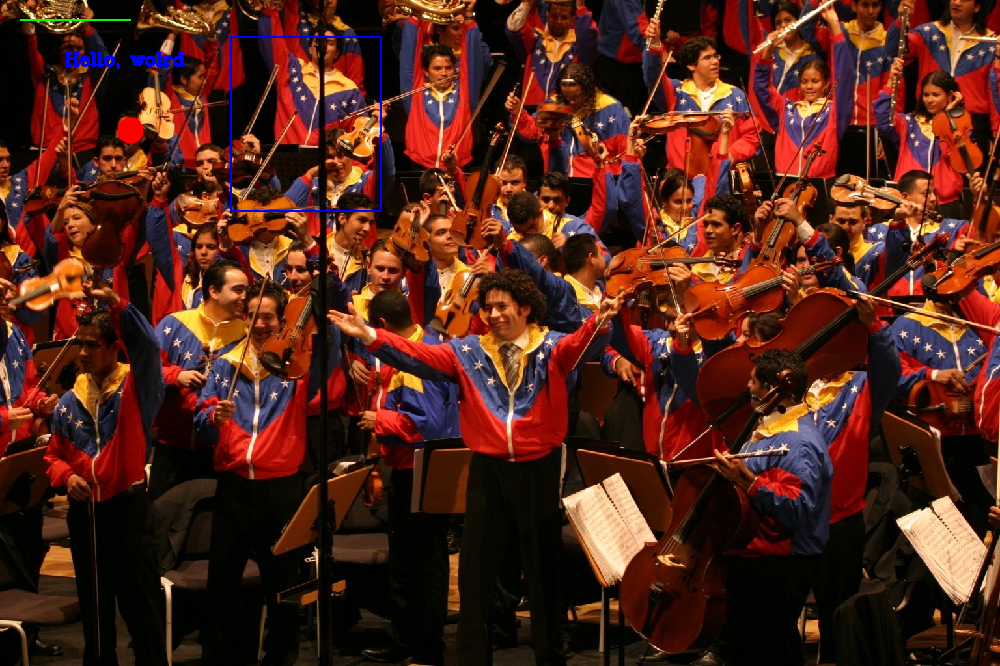

In [45]:
#Create a copy
output = image.copy()
#Arguments, image
cv2.rectangle(output, (354, 324), (584, 57), (255,0,0), 2)
cv2.circle(output, (200, 200), 20, (0, 0, 255), -1)
cv2.line(output, (30, 30), (200,30), (0,255,0), 2)
cv2.putText(output, 'Hello, wolrd', (100, 100), cv2.FONT_HERSHEY_COMPLEX, 0.9, (255,0,0), 4)

cv2_imshow(output)